# Onda simple
---
El modelo para una onda que se mueve solo en la dirección del eje x a través del tiempo es:

$$A(x,t) = A_0 \sin \left[2\pi \left( \frac{x}{\lambda} - \frac{t}{T} \right) \right]$$

Donde:
> * $A_0$ : amplitud de la onda inicial $[m]$
> * $T$ : periodo $[s]$
> * $\lambda$ : longitud de onda $[m]$


In [1]:
using Plots
plotlyjs()

Plots.PlotlyJSBackend()

Cuando dos ondas interfieren entre si se puede representar dicha interferencia con: 

$$A(x,t) = A_0 \left\{\sin \left[2\pi \left( \frac{x}{\lambda _1} - \frac{t}{T_1} \right) \right] + \sin \left[2\pi \left( \frac{x}{\lambda _2} - \frac{t}{T_2} \right) \right] \right\}$$

In [9]:
function two_waves(wave1::Vector{Float64}, wave2::Vector{Float64}) 
    A_0 = 1.0 #m
    λ_1, T_1 = wave1 # m, s
    λ_2, T_2 = wave2 # m, s
    wave1Phase(x::Float64, t::Number)::Float64 = x / λ_1 - t / T_1
    wave2Phase(x::Float64, t::Number)::Float64 = x / λ_2 - t / T_2
    return A(x::Float64, t::Number)::Float64 = A_0 * ( sin(2π * (wave1Phase(x, t))) + sin(2π * (wave2Phase(x, t))) )
end

two_waves (generic function with 1 method)

┌ Info: Saved animation to /tmp/jl_ULGB296J2l.gif
└ @ Plots /home/mofoko/.julia/packages/Plots/sxUvK/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_ULGB296J2l.gif")
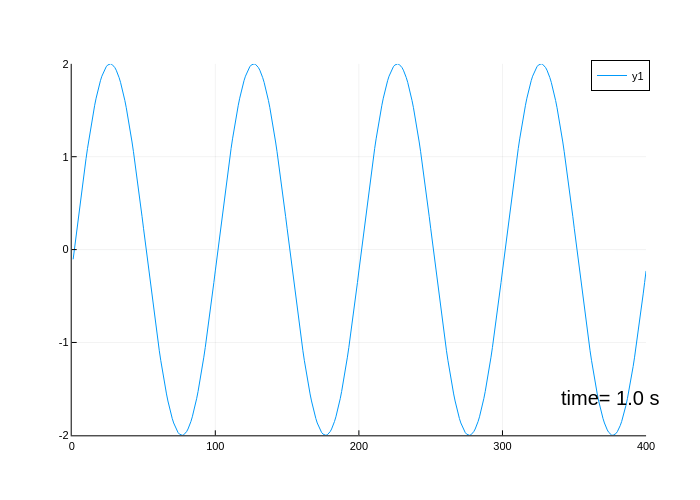

In [12]:
x = 1.0:400.0
t = 1.0:1000.0
anim = @animate for t_i in t
    plot(x, two_waves([100., 60.], [100., 50.]).(x, t_i))
    plot!(ylims = (-2, 2))
    plot!(xlims = (0, 400))
    annotate!(375, -1.6, "time= $(t_i) s")
end
gif(anim, fps = 60)